In this notebook, we will finally create predictive features using the logs we cleaned on notebook 2.2. Our focus, for now, will be prediction using an aggregate non-temporal representation of each student.

Throughout the notebook, we will start with the import of logs and remaining tables that we consider to be relevant for feature engineering and extraction.

#### 1. Importing the relevant packages, setting global variables and importing the relevant files

In [1]:
#import libs
import pandas as pd
import numpy as np

#viz related tools
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm, Normalize
from matplotlib.ticker import MaxNLocator
import matplotlib as mpl
from matplotlib import cm
import seaborn as sns

#tqdm to monitor progress
from tqdm.notebook import tqdm, trange
tqdm.pandas(desc="Progress")

#time related features
from datetime import timedelta

#starting with other tools
sns.set()

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
#global variables that may come in handy
#course threshold sets the % duration that will be considered (1 = 100%)
duration_threshold = [0.1, 0.25, 0.33, 0.5, 1]

#colors for vizualizations
nova_ims_colors = ['#BFD72F', '#5C666C']

#standard color for student aggregates
student_color = '#474838'

#standard color for course aggragates
course_color = '#1B3D2F'

#standard continuous colormap
standard_cmap = 'viridis_r'

In [3]:
#loading student log data 
student_logs = pd.read_csv('../Data/Modeling Stage/R_Gonz_cleaned_logs.csv', 
                           dtype = {
                                   'id': object,
                                   'itemid': object,
                                   'userid': object,
                                   'course': object,
                                   'cmid': object,
                                   },
                                   parse_dates = ['time'],).drop(['Unnamed: 0', 'id', 'url', 'info'], axis = 1).dropna(how = 'all', axis = 1) #logs

#loading support table
support_table = pd.read_csv('../Data/R_Gonz_support_table.csv', 
                           dtype = {
                                   'assign_id': object,
                                   'courseid': object,
                                   'userid': object,
                                   }, 
                            parse_dates = ['sup_time', 'startdate']).drop('Unnamed: 0', axis = 1).dropna(how = 'all', axis = 1)

#save tables 
class_list = pd.read_csv('../Data/Modeling Stage/R_Gonz_class_duration.csv', 
                         dtype = {
                                   'course': object,                                   
                                   },
                        parse_dates = ['Start Date','End Date', 'cuttoff_point']).drop('Unnamed: 0', axis = 1).rename(columns = {'cuttoff_point' : 'Week before start'})

#targets tables 
targets_table = pd.read_csv('../Data/Modeling Stage/R_Gonz_targets_table.csv',
                           dtype = {
                                   'userid': object,
                                   'courseid': object,
                                   },)

We'll start with the general verification of the different datasets we've imported. 

**Starting with the targets table, which includes all valid student-course logs with Final-Grade.**

In [4]:
#get info
targets_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30510 entries, 0 to 30509
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   courseid         30510 non-null  object 
 1   userid           30510 non-null  object 
 2   Grade Mandatory  26676 non-null  float64
 3   Grade Optional   16485 non-null  float64
 4   final_mark       30510 non-null  float64
dtypes: float64(3), object(2)
memory usage: 1.2+ MB


In [5]:
targets_table.describe(include = 'all', datetime_is_numeric = True)

,courseid,userid,Grade Mandatory,Grade Optional,final_mark
count,30510,30510,26676.000000,16485.000000,30510.000000
unique,732,14111,NaN,NaN,NaN
top,2271.0,36779.0,NaN,NaN,NaN
freq,667,10,NaN,NaN,NaN
mean,NaN,NaN,0.303199,0.086236,4.715297
std,NaN,NaN,0.151369,0.144909,3.121882
min,NaN,NaN,0.000000,0.000000,0.000000
25%,NaN,NaN,0.210688,0.000000,2.194832
50%,NaN,NaN,0.339517,0.000000,4.666666
75%,NaN,NaN,0.424005,0.125375,7.423107


In [6]:
targets_table

,courseid,userid,Grade Mandatory,Grade Optional,final_mark
0,1000.0,17391.0,0.500000,NaN,10.000000
1,1000.0,21448.0,0.469512,0.0,4.695122
2,1000.0,21844.0,0.469512,NaN,9.390244
3,1000.0,22429.0,0.451220,NaN,9.024390
4,1000.0,22535.0,0.256098,NaN,5.121951
...,...,...,...,...,...
30505,999.0,74108.0,0.316667,0.0,3.166667
30506,999.0,74173.0,0.311667,0.0,3.116667
30507,999.0,74256.0,0.328333,0.0,3.283333
30508,999.0,8491.0,0.380000,0.0,3.800000


Then, we repeat the same for the list of courses and their respective start and end dates. We know that the number of students attending each course is the number found in the logs. We will need to make further cuts 

In [7]:
class_list.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 562 entries, 0 to 561
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   course                562 non-null    object        
 1   Users per course      562 non-null    float64       
 2   Start Date            562 non-null    datetime64[ns]
 3   End Date              562 non-null    datetime64[ns]
 4   Course duration days  562 non-null    float64       
 5   Week before start     562 non-null    datetime64[ns]
dtypes: datetime64[ns](3), float64(2), object(1)
memory usage: 26.5+ KB


In [8]:
class_list.describe(include = 'all', datetime_is_numeric = True)

,course,Users per course,Start Date,End Date,Course duration days,Week before start
count,562,562.000000,562,562,562.000000,562
unique,562,NaN,NaN,NaN,NaN,NaN
top,1000.0,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN
mean,NaN,51.046263,2014-11-16 17:51:01.921708288,2015-03-17 21:26:15.800711680,122.149466,2014-11-09 17:51:01.921708288
min,NaN,1.000000,2014-08-24 00:00:00,2014-10-01 00:00:00,29.000000,2014-08-17 00:00:00
25%,NaN,17.000000,2014-09-09 00:00:00,2015-01-15 00:00:00,98.000000,2014-09-02 00:00:00
50%,NaN,34.000000,2014-10-20 00:00:00,2015-02-25 00:00:00,122.000000,2014-10-13 00:00:00
75%,NaN,69.000000,2015-01-24 18:00:00,2015-05-25 00:00:00,137.000000,2015-01-17 18:00:00
max,NaN,642.000000,2015-06-01 00:00:00,2015-07-10 00:00:00,306.000000,2015-05-25 00:00:00


In [9]:
class_list

,course,Users per course,Start Date,End Date,Course duration days,Week before start
0,1000.0,12.0,2014-08-31,2015-01-19,142.0,2014-08-24
1,1002.0,22.0,2014-09-28,2015-03-04,158.0,2014-09-21
2,1010.0,48.0,2014-09-11,2014-12-22,103.0,2014-09-04
3,1013.0,71.0,2014-09-23,2015-02-02,133.0,2014-09-16
4,1020.0,64.0,2015-01-11,2015-06-04,145.0,2015-01-04
...,...,...,...,...,...,...
557,984.0,13.0,2014-08-31,2015-01-27,150.0,2014-08-24
558,985.0,22.0,2014-08-24,2015-02-25,186.0,2014-08-17
559,992.0,16.0,2015-02-09,2015-05-12,93.0,2015-02-02
560,993.0,55.0,2014-09-11,2015-01-12,124.0,2014-09-04


We still note a significant presence of courses with small numbers of students. The first step we will take is the removal of all courses whose number of attending students is below 50.

In [10]:
class_list = class_list[class_list['Users per course'] >= 50]

#updating student logs
student_logs = student_logs[student_logs['course'].isin(class_list['course'])]


#additionally updating targets_table
targets_table = targets_table[targets_table['courseid'].isin(class_list['course'])]
class_list.describe(include = 'all', datetime_is_numeric = True)

,course,Users per course,Start Date,End Date,Course duration days,Week before start
count,225,225.000000,225,225,225.000000,225
unique,225,NaN,NaN,NaN,NaN,NaN
top,1013.0,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN
mean,NaN,95.902222,2014-11-14 09:42:24,2015-03-21 06:49:36,127.880000,2014-11-07 09:42:24
min,NaN,50.000000,2014-08-31 00:00:00,2014-10-05 00:00:00,31.000000,2014-08-24 00:00:00
25%,NaN,62.000000,2014-09-08 00:00:00,2015-01-17 00:00:00,106.000000,2014-09-01 00:00:00
50%,NaN,76.000000,2014-10-21 00:00:00,2015-02-09 00:00:00,128.000000,2014-10-14 00:00:00
75%,NaN,107.000000,2015-01-24 00:00:00,2015-05-28 00:00:00,140.000000,2015-01-17 00:00:00
max,NaN,642.000000,2015-05-19 00:00:00,2015-06-30 00:00:00,295.000000,2015-05-12 00:00:00


We'll follow up with taking a closer look logs we cleaned in the previous section. 

In [11]:
student_logs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5160303 entries, 4845 to 6869430
Data columns (total 7 columns):
 #   Column  Dtype         
---  ------  -----         
 0   time    datetime64[ns]
 1   userid  object        
 2   ip      object        
 3   course  object        
 4   module  object        
 5   cmid    object        
 6   action  object        
dtypes: datetime64[ns](1), object(6)
memory usage: 315.0+ MB


In [12]:
student_logs.describe(include = 'all', datetime_is_numeric = True)

,time,userid,ip,course,module,cmid,action
count,5160303,5160303,5160303,5160303,5160303,5160303,5160303
unique,NaN,10700,58859,225,29,14050,94
top,NaN,47527.0,127.0.0.1,2059.0,course,0.0,view
freq,NaN,40537,3097736,129398,2107635,2358478,4079092
mean,2015-01-16 19:08:28.543642880,NaN,NaN,NaN,NaN,NaN,NaN
min,2014-09-01 18:53:34,NaN,NaN,NaN,NaN,NaN,NaN
25%,2014-11-10 12:11:47,NaN,NaN,NaN,NaN,NaN,NaN
50%,2015-01-12 08:29:46,NaN,NaN,NaN,NaN,NaN,NaN
75%,2015-03-23 14:54:55,NaN,NaN,NaN,NaN,NaN,NaN
max,2015-06-29 23:24:54,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
student_logs

,time,userid,ip,course,module,cmid,action
4845,2014-09-01 18:53:34,47196.0,127.0.0.1,2055.0,course,0.0,view
4846,2014-09-01 18:53:39,47196.0,127.0.0.1,2055.0,resource,85645.0,view
4847,2014-09-01 18:53:56,47196.0,127.0.0.1,2055.0,course,0.0,view
4848,2014-09-01 18:54:01,47196.0,127.0.0.1,2055.0,course,0.0,view
4849,2014-09-01 18:54:06,47196.0,127.0.0.1,2055.0,user,0.0,view all
...,...,...,...,...,...,...,...
6868776,2015-06-15 15:37:19,54662.0,127.0.0.1,3094.0,course,0.0,view
6868777,2015-06-15 15:37:38,54662.0,127.0.0.1,3094.0,course,0.0,view
6869428,2015-06-18 08:57:58,52262.0,127.0.0.1,2411.0,course,0.0,view
6869429,2015-06-18 08:58:35,52262.0,127.0.0.1,2411.0,resource,105562.0,view


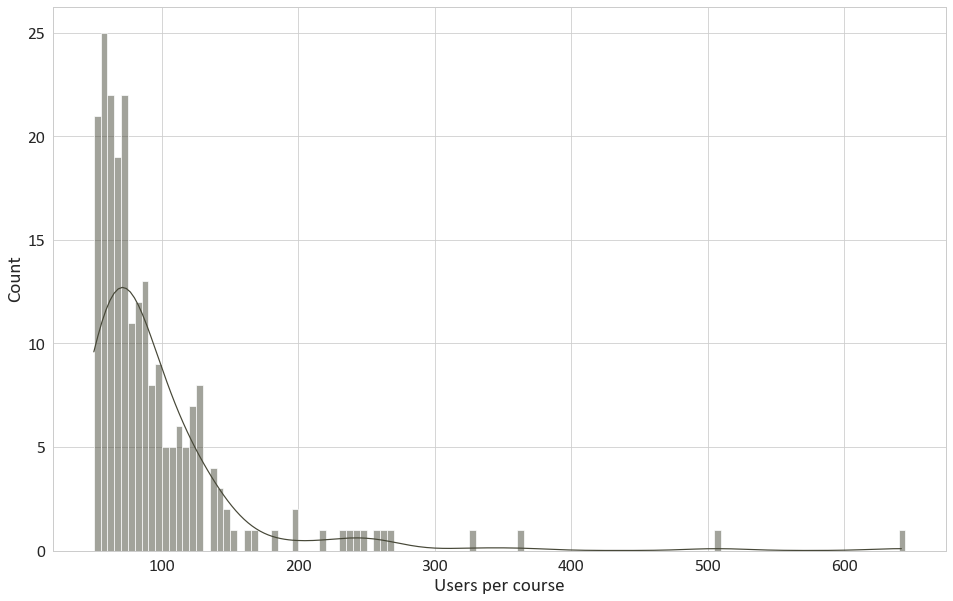

In [14]:
#then we plot an histogram with all courses, we are not interested in keeping courses with a number of students inferior to 10
sns.set_theme(context='paper', style='whitegrid', font='Calibri', rc={"figure.figsize":(16, 10)}, font_scale=2)
hist4 = sns.histplot(data=class_list, x='Users per course', kde=True, color= student_color, binwidth = 5,)

fig = hist4.get_figure()
fig.savefig('../Images/hist4_students_per_course_bin_5.png', transparent=True, dpi=300)

#delete to remove from memory
del fig, hist4


Likewise, there is some attention to be found on courses with abnormally high numbers of attending students in a face-to-face context (over 200). We will pay closer attention to those courses.

In [15]:
#create df only with high affluence courses
most_affluent_courses = class_list[class_list['Users per course'] >= 200]

#separate logs accordingly
high_attendance_logs = student_logs[student_logs['course'].isin(most_affluent_courses['course'])]
high_attendance_logs

,time,userid,ip,course,module,cmid,action
37257,2014-09-03 10:32:56,69599.0,127.0.0.1,2007.0,course,0.0,view
37258,2014-09-03 10:33:10,69599.0,127.0.0.1,2007.0,user,0.0,view all
37259,2014-09-03 10:39:27,69599.0,127.0.0.1,2007.0,course,0.0,view
37260,2014-09-03 10:42:23,69599.0,127.0.0.1,2007.0,course,0.0,view
37261,2014-09-03 10:42:28,69599.0,127.0.0.1,2007.0,resource,83279.0,view
...,...,...,...,...,...,...,...
6851482,2015-06-23 13:44:08,47237.0,127.0.0.1,3022.0,course,0.0,view
6851483,2015-06-28 13:59:04,47237.0,127.0.0.1,3022.0,course,0.0,view
6869428,2015-06-18 08:57:58,52262.0,127.0.0.1,2411.0,course,0.0,view
6869429,2015-06-18 08:58:35,52262.0,127.0.0.1,2411.0,resource,105562.0,view


In [16]:
high_attendance_logs.describe(include = 'all', datetime_is_numeric = 'all')

,time,userid,ip,course,module,cmid,action
count,812003,812003,812003,812003,812003,812003,812003
unique,NaN,2680,8729,12,15,1001,34
top,NaN,63280.0,127.0.0.1,2059.0,course,0.0,view
freq,NaN,2982,608123,129398,356245,374609,673457
mean,2015-02-16 20:29:18.531203072,NaN,NaN,NaN,NaN,NaN,NaN
min,2014-09-03 10:32:56,NaN,NaN,NaN,NaN,NaN,NaN
25%,2014-12-11 22:41:04.500000,NaN,NaN,NaN,NaN,NaN,NaN
50%,2015-03-04 17:32:30,NaN,NaN,NaN,NaN,NaN,NaN
75%,2015-04-20 09:49:38.500000,NaN,NaN,NaN,NaN,NaN,NaN
max,2015-06-28 23:23:50,NaN,NaN,NaN,NaN,NaN,NaN


We can plot the weekly interactions of these courses.

In [17]:
#Then, when it comes to logs, we aggregate by week
grouped_data = high_attendance_logs.groupby([pd.Grouper(key='time', freq='W'), 'course']).agg({
                                                                             'action': 'count',
                                                                             }).reset_index().sort_values('time')
#change for better reading
grouped_data['Date (week)'] = grouped_data['time'].astype(str)

#creating pivot table to create heatmap
grouped_data = grouped_data.pivot_table(index =['course'], 
                       columns = 'Date (week)',
                        values = 'action', 
                       aggfunc =np.sum,
                        fill_value=np.nan).reset_index().rename(columns = {'course' : 'Course'})

#now, we will sort the courses according to the starting date
grouped_data['Course'] = pd.to_numeric(grouped_data['Course']).astype(int)

#finally we create the pivot_table that we will use to create our heatmap
grouped_data = grouped_data.set_index('Course', drop = True)
grouped_data.T.describe(include = 'all').T

,count,mean,std,min,25%,50%,75%,max
Course,,,,,,,,
2007,18.0,2106.055556,1100.755007,116.0,1594.25,1977.5,2705.25,4439.0
2024,21.0,3182.571429,1973.936361,233.0,1540.00,2949.0,4940.00,6549.0
2059,19.0,6810.421053,4453.744097,1277.0,3700.50,5636.0,10547.50,16615.0
2271,18.0,5975.111111,3868.764994,445.0,3792.50,4467.5,9135.25,14147.0
2288,19.0,4139.421053,2721.201334,1533.0,2243.50,3173.0,4674.00,10809.0
2411,23.0,2794.434783,1978.090122,123.0,1494.00,2555.0,3421.50,7784.0
2607,22.0,4725.772727,4132.541383,550.0,2611.50,3851.0,5337.25,20018.0
3022,30.0,1465.800000,1372.654700,94.0,247.25,1331.0,1893.00,5552.0
3033,19.0,2110.631579,1560.074400,524.0,820.00,1478.0,2935.50,5435.0


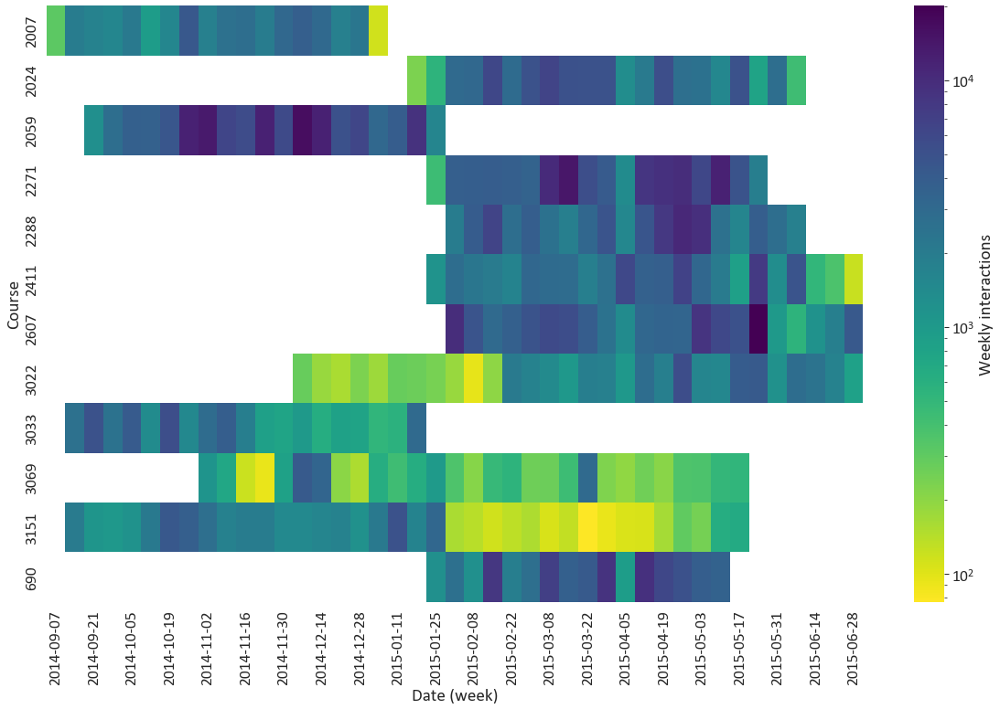

In [18]:
sns.set_theme(context='paper', style='whitegrid', font='Calibri', rc={"figure.figsize":(20, 12)}, font_scale=2)

#here, we are plotting the nex
heat4 = sns.heatmap(grouped_data, robust=True, norm=LogNorm(), xticklabels = 2, yticklabels= 1,
            cmap = standard_cmap, cbar_kws={'label': 'Weekly interactions'})

fig = heat4.get_figure()
fig.savefig('../Images/highest_attendance_weekly_clicks_heat4.png', transparent=True, dpi=300)

#delete to remove from memory
del fig, heat4

While most courses are very clearly restricted to their semester, there are courses that have interactions occurring across the entire year. 

For these courses, we just want to undestand whether all students are interacting continuously or we are speaking of different co-horts of students. As such, we will look more deeply at the following courses:

3022, 3069 and 3151

In [19]:
year_long_high_attendance = ['3022.0', '3069.0', '3151.0']

#Then, when it comes to logs, we aggregate by week
grouped_data = high_attendance_logs[high_attendance_logs['course'].isin(year_long_high_attendance)].groupby([pd.Grouper(key='time', freq='W'), 'course', 'userid']).agg({
                                                                             'action': 'count',
                                                                             }).reset_index().sort_values('time')
#change for better reading
grouped_data['Date (week)'] = grouped_data['time'].astype(str)

#creating pivot table to create heatmap
grouped_data = grouped_data.pivot_table(index =['course', 'userid'], 
                       columns = 'Date (week)',
                        values = 'action', 
                       aggfunc =np.sum,
                        fill_value=np.nan).reset_index().rename(columns = {'course' : 'Course'})

#now, we will sort the courses according to the starting date
grouped_data['Course'] = pd.to_numeric(grouped_data['Course']).astype(int)

#finally we create the pivot_table that we will use to create our heatmap
grouped_data = grouped_data.set_index(['Course', 'userid'], drop = True)
grouped_data.T.describe(include = 'all').T

count       mean        std  min   25%   50%    75%    max
Course userid                                                             
3022   14727.0   23.0  20.173913  30.986290  1.0  2.50  11.0  19.50  142.0
       19329.0   15.0  21.733333  24.618421  1.0  4.00   8.0  42.00   67.0
       23000.0   19.0  12.526316  10.073995  1.0  3.50  10.0  21.50   33.0
       23427.0   13.0  17.230769  19.110005  2.0  5.00  12.0  17.00   67.0
       26356.0   16.0  14.937500  14.359521  1.0  3.00  11.0  19.75   54.0
...               ...        ...        ...  ...   ...   ...    ...    ...
3151   66551.0   22.0  17.454545  18.712683  1.0  5.00  11.0  26.00   77.0
       71150.0   25.0  27.160000  28.125730  1.0  3.00  21.0  33.00  104.0
       72025.0    8.0   8.625000   4.565007  2.0  5.75   9.0   9.75   17.0
       72952.0    8.0   7.750000   4.621379  1.0  4.75   7.5  10.00   15.0
       74192.0   13.0  17.769231  16.161445  1.0  5.00  13.0  25.00   52.0

[719 rows x 8 columns]

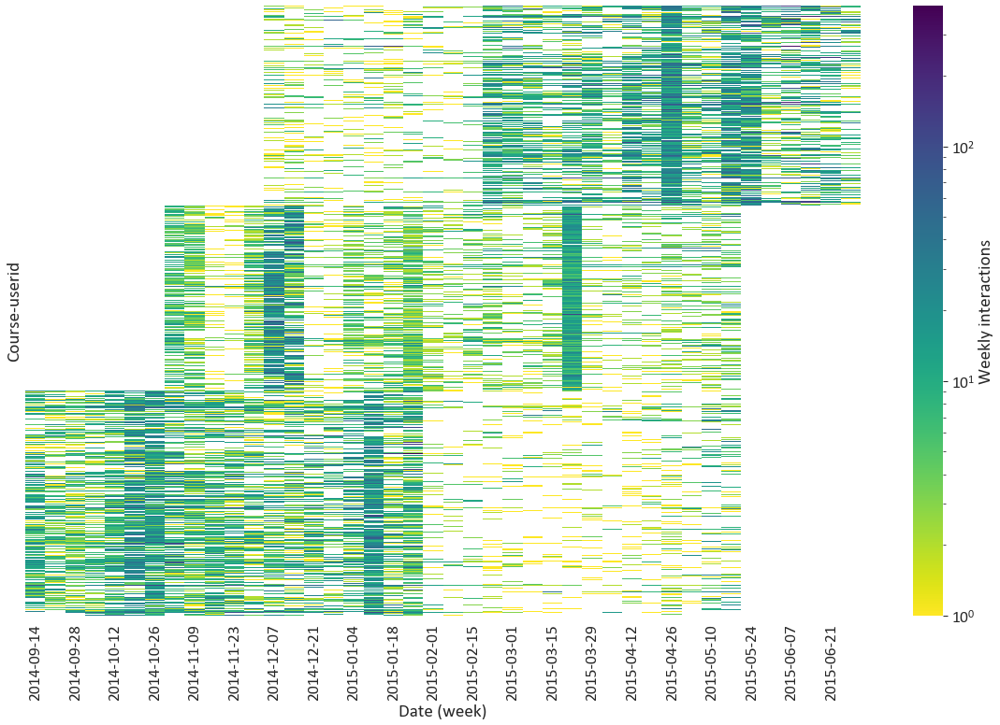

In [20]:
sns.set_theme(context='paper', style='whitegrid', font='Calibri', rc={"figure.figsize":(20, 12)}, font_scale=2)

#here, we are plotting the nex
heat5 = sns.heatmap(grouped_data, robust=True, norm=LogNorm(), xticklabels = 2, yticklabels= 0,
            cmap = standard_cmap, cbar_kws={'label': 'Weekly interactions'})

fig = heat5.get_figure()
fig.savefig('../Images/high_attend_yearlong_weekly_heat5.png', transparent=True, dpi=300)

#delete to remove from memory
del fig, heat5, grouped_data, high_attendance_logs, year_long_high_attendance

After consideration, we find that the student interactions seem to be consistent with the course duration. 

We note, however, that the accesses to course 4923 seem to be inconsistent at best. We will monitor this course (and others) in the following steps. For now, we will proceed with the analysis over targets and support table.

**1. First, we filter by our current list of valid courses.**

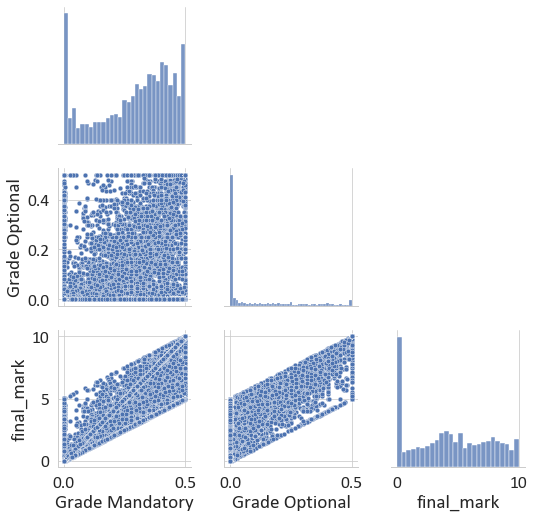

In [21]:
#Representation of different targets depending 
g = sns.PairGrid(targets_table, diag_sharey=False, corner=True)
g.map_diag(sns.histplot)
g.map_lower(sns.scatterplot)
g.add_legend()

In [22]:
#a larger overlook at the different courses
targets_table.groupby('courseid').agg({
                                    'userid' : 'count', 
                                    'Grade Mandatory' : ['min', 'mean', 'max'],
                                    'Grade Optional' : ['min', 'mean', 'max'],                                    
                                    'final_mark' : ['min', 'mean', 'max'],
                                    }).describe(include = 'all')

userid Grade Mandatory                         Grade Optional  \
            count             min        mean         max            min   
count  225.000000      203.000000  203.000000  203.000000     175.000000   
mean    98.013333        0.069314    0.296641    0.438840       0.021212   
std     68.088144        0.112695    0.116563    0.113818       0.073398   
min     50.000000        0.000000    0.001987    0.003375       0.000000   
25%     63.000000        0.000000    0.234911    0.442997       0.000000   
50%     79.000000        0.000042    0.318563    0.485838       0.000000   
75%    109.000000        0.120425    0.383160    0.500000       0.000000   
max    667.000000        0.500000    0.500000    0.500000       0.500000   

                               final_mark                          
             mean         max         min        mean         max  
count  175.000000  175.000000  225.000000  225.000000  225.000000  
mean     0.107867    0.265387    0.858859    4.470493    7.800738  
std      0.136104    0.208401    1.736258    2.526421    2.676416  
min      0.000000    0.000000    0.000000    0.002941    0.128000  
25%      0.000293    0.009250    0.000000    2.582930    6.002083  
50%      0.047349    0.309211    0.000000    4.420961    9.027182  
75%      0.181510    0.475429    0.700000    6.391660   10.000000  
max      0.500000    0.500000   10.000000   10.000000   10.000000

#### Finally, we will take a look at the support table we have and repeat the same steps performed thus far

In [23]:
#separate logs accordingly
support_table = support_table[support_table['courseid'].isin(class_list['course'])]

#get info
support_table.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 175955 entries, 219 to 220922
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   assign_id         175955 non-null  object        
 1   courseid          175955 non-null  object        
 2   startdate         175955 non-null  datetime64[ns]
 3   userid            175955 non-null  object        
 4   sup_time          175955 non-null  datetime64[ns]
 5   mandatory_status  175955 non-null  float64       
 6   delivered         175955 non-null  int64         
 7   assignment_mark   175955 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1), object(3)
memory usage: 12.1+ MB


In [24]:
support_table.describe(include = 'all', datetime_is_numeric = True)

,assign_id,courseid,startdate,userid,sup_time,mandatory_status,delivered,assignment_mark
count,175955,175955,175955,175955,175955,175955.000000,175955.000000,175955.000000
unique,3194,225,NaN,10913,NaN,NaN,NaN,NaN
top,98648.0,2271.0,NaN,72925.0,NaN,NaN,NaN,NaN
freq,657,17871,NaN,121,NaN,NaN,NaN,NaN
mean,NaN,NaN,2014-11-25 02:02:52.946491904,NaN,2015-02-11 04:08:19.686510592,0.525345,0.573868,0.385605
min,NaN,NaN,2014-08-31 22:00:00,NaN,2014-09-04 16:41:44,0.000000,0.000000,0.000000
25%,NaN,NaN,2014-09-09 22:00:00,NaN,2014-12-07 22:48:31,0.000000,0.000000,0.000000
50%,NaN,NaN,2014-12-10 23:00:00,NaN,2015-02-21 13:34:16,1.000000,1.000000,0.200000
75%,NaN,NaN,2015-01-26 23:00:00,NaN,2015-04-20 22:18:22.500000,1.000000,1.000000,0.800000
max,NaN,NaN,2015-05-19 22:00:00,NaN,2015-07-22 21:59:22,1.000000,1.000000,1.000000


In [25]:
support_table

,assign_id,courseid,startdate,userid,sup_time,mandatory_status,delivered,assignment_mark
219,5196.0,174.0,2014-09-08 22:00:00,52123.0,2014-11-18 14:56:51,1.0,1,0.702970
220,5196.0,174.0,2014-09-08 22:00:00,57173.0,2014-11-18 14:46:09,1.0,1,0.653465
221,5196.0,174.0,2014-09-08 22:00:00,60625.0,2014-11-18 15:04:49,1.0,1,0.851485
222,5196.0,174.0,2014-09-08 22:00:00,60643.0,2014-11-18 14:44:08,1.0,1,0.752475
223,5196.0,174.0,2014-09-08 22:00:00,60694.0,2014-11-18 14:48:36,1.0,1,0.752475
...,...,...,...,...,...,...,...,...
220918,272791.0,5646.0,2015-02-04 23:00:00,55804.0,2015-05-27 15:17:53,1.0,1,0.900000
220919,272791.0,5646.0,2015-02-04 23:00:00,60489.0,2015-05-22 16:09:00,1.0,1,0.300000
220920,272791.0,5646.0,2015-02-04 23:00:00,66527.0,2015-05-27 19:41:48,1.0,1,0.900000
220921,272791.0,5646.0,2015-02-04 23:00:00,77034.0,2015-05-27 14:32:56,1.0,1,1.000000


In [26]:
#a larger overlook at the different courses
support_table.groupby('courseid').agg({
                                    'userid' : 'count',
                                    'assign_id' : 'count', 
                                    'mandatory_status' : 'mean',
                                    'delivered' : 'mean',                                    
                                    'assignment_mark' : 'mean',
                                    }).describe(include = 'all')

,userid,assign_id,mandatory_status,delivered,assignment_mark
count,225.000000,225.000000,225.000000,225.000000,225.000000
mean,782.022222,782.022222,0.646406,0.693950,0.463854
std,1386.200709,1386.200709,0.355974,0.319687,0.275016
min,52.000000,52.000000,0.000000,0.001969,0.000394
25%,229.000000,229.000000,0.323944,0.454545,0.217917
50%,469.000000,469.000000,0.794562,0.812500,0.487383
75%,891.000000,891.000000,0.985915,0.993243,0.683895
max,17871.000000,17871.000000,1.000000,1.000000,1.000000


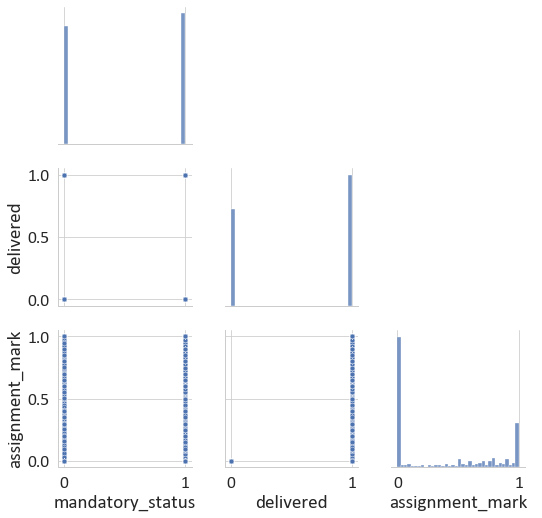

In [27]:
#Representation of different targets depending 
g = sns.PairGrid(support_table, diag_sharey=False, corner=True)
g.map_diag(sns.histplot)
g.map_lower(sns.scatterplot)
g.add_legend()

**Going forward**.

After this preliminary look, we will go forward with extracting features from the Moodle logs. 

In this notebook, we will consider a static non-temporal representation that considers each student-course pair as a row. We will, however, construct different datasets - 1 for each relevant timestep. 

We will rely on features that are regular presences in the literature. Some of these features may appear in more than one work:

**From Macfadyen et al. (2010)**

Count related features:
- Discussion messages posted, 
- Online Sessions, 
- File views,
- Assessments finished, 
- Assessments started, 
- Replies to discussion messages, 
- Mail messages sent, 
- Assignments submitted, 
- Discussion MEssages read, 
- Web link views

Time related features:
- Total time online, 
- Time spent on assignments,


**From Romero et al. (2013)**

Number Accesses to:
- Assignments done,
- Quizzes passed,
- Quizzes failed,
- Forum messages posted, 
- Forum messages read,

Time related features:
- Total time on assignments, 
- Total time on quizzes, 
- Total time on forums

**From Gasevic et. al (2016)**

Number of Accesses of the following variables:
- course logins,
- forum,
- resources,
- Turnitin file submission,
- assignments,
- book,
- quizzes, 
- feedback,
- lessons,
- virtual classroom
- chat,

- etc...

**From Conijn et. al (2017)**

Click count related features:
- Clicks,
- Online sessions, 
- Course page views,
- Resources viewed,
- Links viewed, 
- Discussion post views,
- Content page views,
- Quizzes,
- Quizzes passed,
- Assignments submitted, 
- Wiki edits,
- Wiki views,

Time related features:
- Total time online,
- Largest period of inactivity,
- Time until first action, 
- Averages session time,

Performance related features:
- Average assignment grade,

**Chen and Cui (2020)**

Click count related features:
- Total clicks, 
- Clicks on campus, 
- Online sessions,
- Clicks during weekdays,
- Clicks on weekend,
- Assignments, 
- File,
- Forum,
- Overview Report,
- Quizz,
- System, 
- User Report

Time related features
- Total time of online sessions, 
- Mean duration of online sessions, 
- SD of time between sessions, 
- Total time on Quiz, 
- Total time on File, 
- SD of time on File, 

Other statistics
- Ratio between on-campups and off-campus clicks

**Nuno Rosário Thesis**
- number of forum messages read, 
- number of forum messages posted, 
- number of pages,
- number of clicks, 
- number of submissions,
- number of files accessed,

As stated, some of the features are calculated across multiple works - and these only address the course level. They are not designed specifically for course-agnostic purposes.

First, **we will split the logs by the difference courses and, for each student calculate the different features we intend to calculate.** The are calculated via aggregate operations, from the most common (appear more times in our literature).

**But before that**, we will look at different columns of our logs and, when appropriate, keep the different values they may take. The first, and most immediate correction is IP - 127.0.0.1 hints at local connection, while other IPs suggest an out of Campus connection. 

In [28]:
#converts up to on_campus
student_logs['on_campus'] = np.where(student_logs['ip'] == '127.0.0.1', 1, 0)
student_logs.drop('ip', axis = 1, inplace = True)

Secondly, we take a look at the actions and the modules. Here, we can find the most common actions and modules.

We are familiar with the most common features: course, resources, assignments, quiz, forums, etc...

There are, however, other less common labels whose usage is not very common. We can, start by grouping together the less common modules together in a way that, at least intuitively, makes sense.

In [29]:
#other pages with unclear meaning will be grouped together
other_modules = ['oublog', 'data', 'data', 'bigbluebuttonbn', 'nanogong', 'role', 'notes', 'calendar', 'recordingsbn', 'bookmark']

#converts discussion points to forum or, alternatively,groups other elements to other category
student_logs['module'] = np.where(student_logs['module'] == 'discussion', 'forum',
                                  np.where(student_logs['module'] == 'imscp', 'resource', #imscp is what allows content packages to be posted
                                  np.where(student_logs['module'].isin(other_modules), 'others', student_logs['module'])))

del other_modules

Likewise, we will need to take a look at the different actions in order to understand how common these may be. 

Again, we will look at different actions and see how we can group them together in a way that, at least, makes intuitive sense. There is use in keeping the distinction between different types of view.

In [30]:
#updates and edits related to making editions on presented information:
update_related = ['edit post', 'edit override',  'edit report', 'update mod'
                  'update submission', 'update entry', 'editsection', 'update switch phase',
               'update assessment',   'update post', 'editquestions', 'update submission', 'edit', 'update mod']

#additions 
addition = ['add assessment', 'add category', 'add item', 'add submission', 'add page', 'add mod', 'add entry', 'add post', 'add discussion',
            'add', 'save report','add comment']

#deletion
deletion = ['delete override', 'record delete', 'delete entry', 'delete', 'delete post',
            'delete discussion', 'delete attempt','delete mod',]

#likewise, we will also join other moderation related tasks together,
moderation = ['restore', 'save', 'unlock submission', 'stop tracking', 'assign', 'lock submission', 'usage report',
              'start tracking', 'view subscribers', 'grade submission', 'grant extension', 'manualgrade']

#other reporting actions
report = ['report live', 'report participation', 'report', 'report log', 'report outline', 'view report', 'user report']

#messages/files
messages = ['message saved', 'message sent', 'files']

#other actions
other_actions = ['preview', 'unsubscribe', 'download all submissions', 'mark read', 'subscribeall', 'diff', 'comment', 
                 'unsubscribeall', 'search', 'history', 'map', 'subscribe', 'submissioncopied', 'comments']

#smaller view commands to join main view
small_view = ['view entry', 'view edit']

#converts discussion points to forum or, alternatively,groups other elements to other category
student_logs['action'] = np.where(student_logs['action'].isin(update_related), 'update', #edit list
                                  np.where(student_logs['action'].isin(addition), 'addition', #addition list
                                  np.where(student_logs['action'].isin(deletion), 'delete', #deletion list
                                  np.where(student_logs['action'].isin(moderation), 'other admin actions', #other admin actions
                                  np.where(student_logs['action'].isin(report), 'report', #reporting related
                                  np.where(student_logs['action'].isin(other_actions), 'other actions', #other actions
                                  np.where(student_logs['action'].isin(messages), 'messages and files', #messages
                                  np.where(student_logs['action'].isin(small_view), 'view others', #main view files
                                  np.where(student_logs['action'] == 'choose again','choose', #choose again to choose
                                  
                                  #finishing with splitting the view command to different subgroups according to the module - will make it easier later
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'assign'),'view assignment',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'choice'),'view choice',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'course'),'view course',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'folder'),'view folder',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'glossary'),'view glossary',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'others'),'view others',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'page'),'view page',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'questionnaire'),'view questionnaire',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'resource'),'view resource',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'url'),'view url',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'user'),'view user',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'wiki'),'view wiki',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'workshop'),'view workshop',
                                  np.where((student_logs['action'] == 'view') & (student_logs['module'] == 'quiz'),'view quiz',                             
                                  student_logs['action'])))))))))))))))))))))))

#we finish by ending these lists we've created
del update_related, addition, deletion, moderation, messages, other_actions, small_view 

In [32]:
#uncomment to verify pairings
# with pd.option_context('display.max_rows', None,):
#     display(student_logs.groupby(['action', 'module']).size().to_frame())

We have addressed the most obvious possible aggregations. Now, we will go forward with our intended feature extraction and selection.

For this step, we will create 5 distinct dicts of dataframes. Each dict refers to a certain course duration threshold.

In [33]:
#additionally, we will look at our estimated course duration
for i in tqdm(duration_threshold):
    #create, for each desired threshold, the appropriate cutoff date 
    class_list[f'Date_threshold_{int(i*100)}%'] = pd.to_datetime((class_list['Start Date'] + pd.to_timedelta(class_list['Course duration days'] * i, unit = 'Days')).dt.date)
    
#then, we will create a dictionary of dictionaries, each main dictionary storing and a version of the logs
logs_dict = {}

for i in tqdm(duration_threshold):
    #create, for each desired threshold, a different dictionary of dataframes wherein we will perform the different operations 
    logs_dict[f'Date_threshold_{int(i*100)}%'] = {course: student_logs.loc[student_logs['course'] == course].reset_index(drop = True) for course in tqdm(student_logs['course'].unique())}
    
del student_logs

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

Now, we have a nested dictionary with different dataframes inside it. We will use this data structure to perform the most of the operations we are interested in.

**First, we will add, to each dataframe, a column with the corresponding threshold date**

After this cleaning procedure, we will all different columns referring to our features of interest. These will be:
1. Number of assignments submitted, 
2. Number of online sessions,
3. Discussion messages read,
4. Resource views, 
5. Time spent on assignments,
6. Assessments started,
7. Total time online,
8. Assignment views,
9. Average duration of session,
10. Messages posted,
11. Clicks on Forum, 
12. Quizzes passed, 
13. Time on forum, 
14. On-campus clicks, 
15. On-campus/off-campus clicks,

To check difference between inclusion and not inclusion

16. Average grade of assignments (optional)

A double loop is not very efficient but, to the best of my ability, is the obvious solution to perform these operations. 

In [38]:
#for each intended course duration threshold
for i in tqdm(logs_dict):
    #start with creating a dictionary of course and intended cuttoff date
    cut = class_list.set_index('course').to_dict()[i] 
    
    #for each dataframe
    for j in tqdm(logs_dict[i]):
        #where the course is the same as in the class_list, get the corresponding value of the appropriate column,
        logs_dict[i][j]['Date Threshold'] = logs_dict[i][j]['course'].map(cut)
        logs_dict[i][j] = logs_dict[i][j][logs_dict[i][j]['time'] <= logs_dict[i][j]['Date Threshold']].reset_index(drop = True).drop('Date Threshold', axis = 1)
        
        #calculates the difference between previous within group row and current
        logs_dict[i][j]['t_diff'] = logs_dict[i][j].sort_values(['userid', 'time']).groupby('userid')['time'].diff()
        
        #will need to ignore dictionaries where there is no lenght
        if len(logs_dict[i][j]) > 0:
            #the nans will be correspond to the first interaction made by each student - also signaling the start of the first session
            logs_dict[i][j]['session'] = np.where(logs_dict[i][j]['t_diff'].isna(), 1, #the first session is started by nans
                                             np.where(logs_dict[i][j]['t_diff'] > pd.to_timedelta(40, unit = 'minutes'), 1, #also identify the starting point of new sessions
                                                      0))
            
            #then, we cumulative sum all in-group members 
            logs_dict[i][j]['session'] = logs_dict[i][j].groupby('userid')['session'].transform(pd.Series.cumsum)
            
            #before finishing this step, we will calculate the accumulated duration of a session
            logs_dict[i][j]['mask'] = np.where(logs_dict[i][j]['t_diff'].isna(), 0, #the first session is started by nans
                                      np.where(logs_dict[i][j]['t_diff'] > pd.to_timedelta(40, unit = 'minutes'), 0, #also identify the starting point of new sessions
                                      logs_dict[i][j]['t_diff'].dt.total_seconds()))
            #fillnas in t_diff
            logs_dict[i][j]['t_diff'].fillna(pd.to_timedelta(0), inplace = True)

            #then, we cumulative sum all in-group members 
            logs_dict[i][j]['session_cumul_time'] = logs_dict[i][j].groupby(['userid','session'])['mask'].transform(pd.Series.cumsum)
            logs_dict[i][j]['session_cumul_time'] = pd.to_timedelta(logs_dict[i][j]['session_cumul_time'], unit = 'seconds')
            #drop mask
            logs_dict[i][j].drop('mask', axis = 1, inplace = True)
        
        else:
            continue

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

In [40]:
#create backup
backup = logs_dict.copy()

In [50]:
backup

{'Date_threshold_10%': {'2055.0':                  action                                           \
  module             book course                            folder   
  action         view all recent view course view section view all   
  on_campus             1      1           1            1        1   
  course userid                                                      
  2055.0 16464.0      NaN    NaN         5.0          2.0      NaN   
         16598.0      NaN    NaN         7.0          3.0      NaN   
         19986.0      NaN    NaN         1.0          NaN      NaN   
         20003.0      NaN    NaN         8.0          2.0      NaN   
         22638.0      NaN    NaN         6.0          2.0      NaN   
  ...                 ...    ...         ...          ...      ...   
         55656.0      NaN    NaN         3.0          NaN      NaN   
         57716.0      NaN    NaN         6.0          NaN      NaN   
         57743.0      NaN    NaN        10.0          3.0 

In [48]:
logs_dict = backup.copy()

Now, we'll go forward with the creation of the features using these datasets. We will do it, using groupby commands.

After this cleaning procedure, we will all different columns referring to our features of interest. These will be:
1. Number of assignments submitted, 
2. Number of online sessions,
3. Discussion messages read,
4. Resource views, 
5. Time spent on assignments,
6. Assessments started,
7. Total time online,
8. Assignment views,
9. Average duration of session,
10. Messages posted,
11. Clicks on Forum, 
12. Quizzes passed, 
13. Time on forum, 
14. On-campus clicks, 
15. On-campus/off-campus clicks,

To check difference between inclusion and not inclusion

16. Average grade of assignments (optional)

In [49]:
#we will need to perform the same double loop we have done before
for i in tqdm(logs_dict):
    
    #we will perform different operations 
    for j in tqdm(logs_dict[i]):
        
        #where the course is the same as in the class_list, get the corresponding value of the appropriate column,
        logs_dict[i][j] = pd.pivot_table(logs_dict[i][j], index=['course', 'userid'],
                                        columns = ['module', 'action', 'on_campus'],
                                         aggfunc={'module' : 'count',
                                                  'action' : 'count',
                                                  'on_campus' : 'mean'}).reset_index()

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/225 [00:00<?, ?it/s]

ValueError: Grouper for 'module' not 1-dimensional

In [46]:
logs_dict['Date_threshold_25%']['2058.0']

action                                                       \
module         assign                                                        
action         submit      submit for grading view all     view assignment   
on_campus           0    1                  0        0   1               0   
course userid                                                                
2058.0 22549.0    NaN  NaN                NaN      NaN NaN             4.0   
       31540.0    4.0  1.0                1.0      NaN NaN            31.0   
       52968.0    5.0  1.0                NaN      3.0 NaN            40.0   
       62127.0    3.0  1.0                1.0      NaN NaN            24.0   
       62522.0    5.0  1.0                1.0      NaN NaN            31.0   
...               ...  ...                ...      ...  ..             ...   
       72435.0    3.0  1.0                NaN      2.0 NaN            13.0   
       72531.0    6.0  1.0                1.0      NaN NaN            22.0   
       73118.0    3.0  2.0                1.0      NaN NaN            24.0   
       73125.0    NaN  NaN                NaN      NaN NaN             NaN   
       73147.0    4.0  1.0                1.0      NaN NaN            24.0   

                                                          \
module                                                     
action               view confirm submit assignment form   
on_campus          1                                   0   
course userid                                              
2058.0 22549.0   NaN                                 NaN   
       31540.0   5.0                                 1.0   
       52968.0  17.0                                 NaN   
       62127.0   5.0                                 1.0   
       62522.0   8.0                                 1.0   
...              ...                                 ...   
       72435.0   4.0                                 NaN   
       72531.0   8.0                                 1.0   
       73118.0   4.0                                 1.0   
       73125.0   NaN                                 NaN   
       73147.0   7.0                                 2.0   

                                                 ...     on_campus       \
module                                           ...      resource        
action         view submit assignment form       ... view resource        
on_campus                                0    1  ...             0    1   
course userid                                    ...                      
2058.0 22549.0                         NaN  NaN  ...           0.0  NaN   
       31540.0                         7.0  4.0  ...           0.0  1.0   
       52968.0                         6.0  1.0  ...           0.0  1.0   
       62127.0                         5.0  2.0  ...           0.0  1.0   
       62522.0                         6.0  1.0  ...           0.0  1.0   
...                                    ...  ...  ...           ...  ...   
       72435.0                         3.0  2.0  ...           0.0  1.0   
       72531.0                         7.0  2.0  ...           0.0  1.0   
       73118.0                         3.0  2.0  ...           0.0  1.0   
       73125.0                         NaN  NaN  ...           0.0  NaN   
       73147.0                         5.0  1.0  ...           0.0  1.0   

                                                                         
module              url                        user                      
action         view all      view url      view all      view user       
on_campus             0    1        0    1        0    1         0    1  
course userid                                                            
2058.0 22549.0      NaN  NaN      NaN  NaN      0.0  NaN       0.0  NaN  
       31540.0      NaN  NaN      0.0  NaN      NaN  NaN       NaN  NaN  
       52968.0      NaN  1.0      NaN  NaN      0.0  1.0       0.0  1.0  
       62127

In [ ]:
logs_dict.keys()